<a href="https://colab.research.google.com/github/Koeliya-02/drone_navigation_project2023/blob/main/yolov8_training_on_hit_uav.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!pip install -q ultralytics imutils

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 645.3/645.3 kB 8.7 MB/s eta 0:00:00


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
from tqdm.auto import tqdm

import os
import requests
import zipfile
import cv2
import math
import matplotlib.pyplot as plt
import glob
import numpy as np
import random

from PIL import Image

## Visualize dataset

In [4]:
ROOT_DIR = '/content/drive/MyDrive/hit-uav'
train_imgs_dir = 'images/train'
train_labels_dir = 'labels/train'
val_imgs_dir = 'images/val'
val_labels_dir = 'labels/val'
test_imgs_dir = 'images/test'
test_labels_dir = 'labels/test'
classes = ['Person', 'Car', 'Bicycle', 'OtherVechicle', 'DontCare']
colors = np.random.uniform(0, 255, size=(len(classes), 3))

In [5]:
# Function to convert bounding boxes in YOLO format to xmin, ymin, xmax, ymax.
def yolo2bbox(bboxes):
    xmin, ymin = bboxes[0]-bboxes[2]/2, bboxes[1]-bboxes[3]/2
    xmax, ymax = bboxes[0]+bboxes[2]/2, bboxes[1]+bboxes[3]/2
    return xmin, ymin, xmax, ymax

In [6]:
def plot_box(image, bboxes, labels, classes=classes, colors=colors, pos='above'):
    # Need the image height and width to denormalize
    # the bounding box coordinates
    height, width, _ = image.shape
    lw = max(round(sum(image.shape) / 2 * 0.003), 2)  # Line width.
    tf = max(lw - 1, 1) # Font thickness.
    for box_num, box in enumerate(bboxes):
        x1, y1, x2, y2 = yolo2bbox(box)
        # denormalize the coordinates
        xmin = int(x1*width)
        ymin = int(y1*height)
        xmax = int(x2*width)
        ymax = int(y2*height)

        p1, p2 = (int(xmin), int(ymin)), (int(xmax), int(ymax))

        class_name = classes[int(labels[box_num])]

        color=colors[classes.index(class_name)]

        cv2.rectangle(
            image,
            p1, p2,
            color=color,
            thickness=lw,
            lineType=cv2.LINE_AA
        )

        # For filled rectangle.
        w, h = cv2.getTextSize(
            class_name,
            0,
            fontScale=lw / 3,
            thickness=tf
        )[0]

        outside = p1[1] - h >= 3

        if pos == 'above':
            p2 = p1[0] + w, p1[1] - h - 3 if outside else p1[1] + h + 3
            cv2.rectangle(
                image,
                p1, p2,
                color=color,
                thickness=-1,
                lineType=cv2.LINE_AA
            )
            cv2.putText(
                image,
                class_name,
                (p1[0], p1[1] - 5 if outside else p1[1] + h + 2),
                cv2.FONT_HERSHEY_SIMPLEX,
                fontScale=lw/3.5,
                color=(255, 255, 255),
                thickness=tf,
                lineType=cv2.LINE_AA
            )
        else:
            new_p2 = p1[0] + w, p2[1] + h + 3 if outside else p2[1] - h - 3
            cv2.rectangle(
                image,
                (p1[0], p2[1]), new_p2,
                color=color,
                thickness=-1,
                lineType=cv2.LINE_AA
            )
            cv2.putText(
                image,
                class_name,
                (p1[0], p2[1] + h + 2 if outside else p2[1]),
                cv2.FONT_HERSHEY_SIMPLEX,
                fontScale=lw/3,
                color=(255, 255, 255),
                thickness=tf,
                lineType=cv2.LINE_AA
            )
    return image

In [7]:
# Function to plot images with the bounding boxes.
def plot(image_path, label_path, num_samples, classes=classes, colors=colors, pos='above'):
    all_training_images = glob.glob(image_path+'/*')
    all_training_labels = glob.glob(label_path+'/*')
    all_training_images.sort()
    all_training_labels.sort()

    temp = list(zip(all_training_images, all_training_labels))
    random.shuffle(temp)
    all_training_images, all_training_labels = zip(*temp)
    all_training_images, all_training_labels = list(all_training_images), list(all_training_labels)

    num_images = len(all_training_images)

    if num_samples == -1:
        num_samples = num_images

    num_cols = 2
    num_rows = int(math.ceil(num_samples / num_cols))

    plt.figure(figsize=(10 * num_cols, 6 * num_rows))
    for i in range(num_samples):
        image_name = all_training_images[i].split(os.path.sep)[-1]
        image = cv2.imread(all_training_images[i])
        with open(all_training_labels[i], 'r') as f:
            bboxes = []
            labels = []
            label_lines = f.readlines()
            for label_line in label_lines:
                label, x_c, y_c, w, h = label_line.split(' ')
                x_c = float(x_c)
                y_c = float(y_c)
                w = float(w)
                h = float(h)
                bboxes.append([x_c, y_c, w, h])
                labels.append(label)
        result_image = plot_box(image, bboxes, labels, classes, colors, pos)
        plt.subplot(num_rows, num_cols, i+1) # Visualize 2x2 grid of images.
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
    plt.tight_layout()
    plt.show()

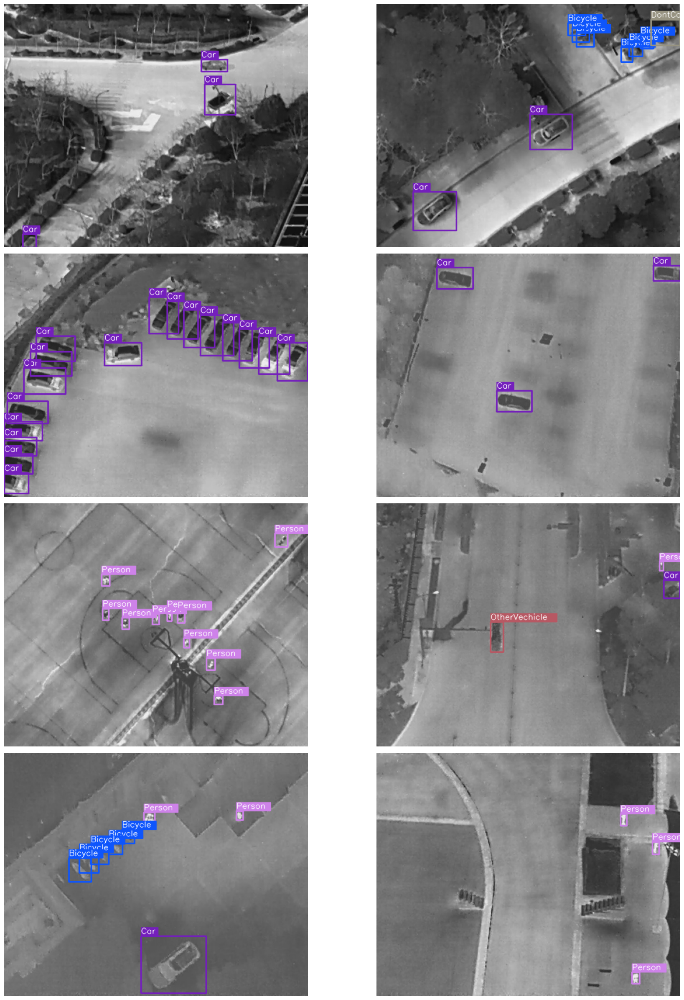

In [8]:
# Visualize a few training images.
plot(
    image_path=os.path.join(ROOT_DIR, train_imgs_dir),
    label_path=os.path.join(ROOT_DIR, train_labels_dir),
    num_samples=8
)

# Prepare dataset

In [ ]:
%%writefile dataset.yaml

path: /kaggle/input/hituav-a-highaltitude-infrared-thermal-dataset/hit-uav
train: images/train
val: images/val
test: images/test
names:
  0: Person
  1: Car
  2: Bicycle
  3: OtherVehicle
  4: DontCare
nc: 5

# Training

## YoloV8m

In [9]:
# Disable wandb
import os
os.environ['WANDB_DISABLED'] = 'true'

In [10]:
from ultralytics import YOLO
# Load a model
# model = YOLO("yolov8s.yaml")  # build a new model from scratch
model = YOLO("yolov8m.pt")  # load a pretrained model (recommended for training)

100%|██████████| 49.7M/49.7M [00:00<00:00, 321MB/s]


In [14]:
# Use the model
results = model.train(
   data='dataset.yaml',
   imgsz=512,
   epochs=50,
   batch=16,
   name='yolov8m_v8_50e'
)  # train the model

Ultralytics YOLOv8.0.213 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=dataset.yaml, epochs=50, patience=50, batch=16, imgsz=512, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=yolov8m_v8_50e4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize

100%|██████████| 755k/755k [00:00<00:00, 36.6MB/s]


Overriding model.yaml nc=80 with nc=5

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics

100%|██████████| 6.23M/6.23M [00:00<00:00, 164MB/s]


AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/hit-uav/labels/train... 2008 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2008/2008 [17:34<00:00,  1.90it/s]


train: New cache created: /content/drive/MyDrive/hit-uav/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/MyDrive/hit-uav/labels/val... 287 images, 0 backgrounds, 0 corrupt: 100%|██████████| 287/287 [02:29<00:00,  1.92it/s]

val: New cache created: /content/drive/MyDrive/hit-uav/labels/val.cache


Plotting labels to runs/detect/yolov8m_v8_50e4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
Image sizes 512 train, 512 val
Using 2 dataloader workers
Logging results to runs/detect/yolov8m_v8_50e4
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      4.39G      1.649      1.616      1.083         65        512: 100%|██████████| 126/126 [01:04<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.73it/s]

                   all        287       2460      0.798      0.384      0.406      0.217



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      4.52G      1.564      1.144      1.056        182        512: 100%|██████████| 126/126 [00:55<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.52it/s]

                   all        287       2460      0.565      0.306      0.328      0.164



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      4.49G      1.562      1.117      1.066        122        512: 100%|██████████| 126/126 [00:55<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.51it/s]

                   all        287       2460       0.62      0.372      0.418      0.217



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      4.53G      1.557      1.057      1.062        116        512: 100%|██████████| 126/126 [00:55<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.49it/s]

                   all        287       2460       0.81      0.358      0.402      0.218



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      4.51G      1.501     0.9957      1.045        182        512: 100%|██████████| 126/126 [00:55<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.94it/s]

                   all        287       2460      0.833       0.46      0.501      0.272



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50       4.5G      1.483     0.9724      1.044        141        512: 100%|██████████| 126/126 [00:55<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.46it/s]

                   all        287       2460      0.726      0.399      0.464      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      4.49G      1.436     0.9155      1.017         87        512: 100%|██████████| 126/126 [00:55<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.27it/s]

                   all        287       2460      0.494      0.496      0.501      0.292



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      4.51G      1.439     0.9118      1.013        111        512: 100%|██████████| 126/126 [00:55<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.46it/s]

                   all        287       2460      0.621      0.491      0.579      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      4.51G      1.391     0.8483      1.004         87        512: 100%|██████████| 126/126 [00:56<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.31it/s]

                   all        287       2460      0.738      0.499      0.556      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      4.53G      1.366     0.8372     0.9996         95        512: 100%|██████████| 126/126 [00:55<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.48it/s]

                   all        287       2460      0.805      0.569      0.631      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50       4.6G      1.352     0.8141     0.9951        142        512: 100%|██████████| 126/126 [00:54<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.00it/s]

                   all        287       2460      0.735      0.567      0.644      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      4.56G      1.329     0.7913      0.989         88        512: 100%|██████████| 126/126 [00:55<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.40it/s]

                   all        287       2460      0.778      0.565      0.651      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      4.52G      1.328     0.7871      0.978        169        512: 100%|██████████| 126/126 [00:55<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.54it/s]

                   all        287       2460      0.788      0.603       0.67      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      4.55G      1.353     0.7761     0.9813         94        512: 100%|██████████| 126/126 [00:55<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.38it/s]

                   all        287       2460      0.768      0.605      0.678      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      4.52G      1.297     0.7426     0.9783         87        512: 100%|██████████| 126/126 [00:55<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.34it/s]

                   all        287       2460      0.619      0.669      0.707      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      4.56G      1.297     0.7394     0.9741         59        512: 100%|██████████| 126/126 [00:54<00:00,  2.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.60it/s]

                   all        287       2460      0.756      0.598      0.656      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      4.55G      1.274      0.729     0.9618        102        512: 100%|██████████| 126/126 [00:54<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.38it/s]

                   all        287       2460      0.821      0.646      0.718      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50       4.6G      1.271     0.7136     0.9692        104        512: 100%|██████████| 126/126 [00:54<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.46it/s]

                   all        287       2460      0.749      0.574       0.67      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      4.52G      1.256     0.6995      0.963         86        512: 100%|██████████| 126/126 [00:59<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.33it/s]

                   all        287       2460      0.824      0.647      0.736      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      4.58G      1.249     0.6877     0.9627        106        512: 100%|██████████| 126/126 [00:56<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.05it/s]

                   all        287       2460      0.732       0.67      0.713      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      4.52G      1.235     0.6905      0.955         89        512: 100%|██████████| 126/126 [00:56<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.55it/s]

                   all        287       2460      0.776      0.645      0.704      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      4.59G      1.213     0.6618     0.9515        202        512: 100%|██████████| 126/126 [00:55<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.88it/s]

                   all        287       2460      0.757      0.702      0.738      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      4.55G      1.212     0.6505     0.9429        130        512: 100%|██████████| 126/126 [00:54<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.93it/s]

                   all        287       2460      0.811      0.646      0.719      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      4.56G      1.201     0.6567     0.9439        122        512: 100%|██████████| 126/126 [00:54<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.42it/s]

                   all        287       2460      0.787      0.643      0.724      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      4.55G      1.205     0.6509     0.9428         99        512: 100%|██████████| 126/126 [00:55<00:00,  2.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.99it/s]

                   all        287       2460      0.836      0.681      0.709      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      4.64G      1.187     0.6341     0.9385         74        512: 100%|██████████| 126/126 [00:53<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.49it/s]

                   all        287       2460       0.82      0.658      0.743      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      4.53G      1.167     0.6176     0.9323         90        512: 100%|██████████| 126/126 [00:55<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.35it/s]

                   all        287       2460      0.787      0.633      0.703      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      4.52G      1.174     0.6206     0.9384        157        512: 100%|██████████| 126/126 [00:55<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.31it/s]

                   all        287       2460      0.806      0.655      0.728      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      4.53G      1.162     0.6124     0.9381        146        512: 100%|██████████| 126/126 [00:55<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.47it/s]

                   all        287       2460      0.815      0.674      0.748      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      4.54G      1.158     0.6081     0.9393         67        512: 100%|██████████| 126/126 [00:56<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.42it/s]

                   all        287       2460      0.841      0.718      0.764      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      4.56G      1.156     0.5927     0.9262        131        512: 100%|██████████| 126/126 [00:56<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.78it/s]

                   all        287       2460      0.877      0.716      0.769      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      4.55G      1.123     0.5831     0.9249        137        512: 100%|██████████| 126/126 [00:55<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.80it/s]

                   all        287       2460        0.8      0.685      0.746      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      4.56G      1.115     0.5754     0.9194        127        512: 100%|██████████| 126/126 [00:55<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.41it/s]

                   all        287       2460       0.83      0.723      0.784      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      4.51G      1.119     0.5728     0.9188         86        512: 100%|██████████| 126/126 [00:56<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.45it/s]

                   all        287       2460      0.832       0.68      0.738      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      4.53G      1.116     0.5741     0.9202        106        512: 100%|██████████| 126/126 [00:55<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.25it/s]

                   all        287       2460      0.783      0.712      0.739      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      4.51G      1.093      0.559     0.9147         58        512: 100%|██████████| 126/126 [00:56<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.46it/s]

                   all        287       2460      0.771       0.69      0.764      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      4.53G      1.098     0.5597     0.9146        100        512: 100%|██████████| 126/126 [00:56<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.39it/s]

                   all        287       2460      0.792      0.702      0.756      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      4.55G      1.092     0.5542     0.9142        204        512: 100%|██████████| 126/126 [00:56<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.28it/s]

                   all        287       2460      0.814      0.681      0.759      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      4.52G       1.09      0.553     0.9084         99        512: 100%|██████████| 126/126 [00:56<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.49it/s]

                   all        287       2460      0.854        0.7      0.761      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      4.51G       1.07     0.5408     0.9098        151        512: 100%|██████████| 126/126 [00:56<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.29it/s]

                   all        287       2460      0.755      0.774       0.77        0.5


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      4.52G      1.077     0.5333     0.9125         78        512: 100%|██████████| 126/126 [00:56<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.54it/s]

                   all        287       2460      0.821       0.76      0.781      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      4.62G      1.063     0.5165     0.9175         44        512: 100%|██████████| 126/126 [00:52<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.29it/s]

                   all        287       2460      0.821      0.723      0.762      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      4.52G       1.06     0.5127     0.9049         39        512: 100%|██████████| 126/126 [00:52<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.44it/s]

                   all        287       2460       0.82      0.703      0.738       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      4.61G       1.05     0.5026     0.9086        106        512: 100%|██████████| 126/126 [00:53<00:00,  2.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.54it/s]

                   all        287       2460      0.856      0.737      0.771      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      4.49G      1.039     0.4984     0.9081         93        512: 100%|██████████| 126/126 [00:52<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.16it/s]

                   all        287       2460      0.754      0.758      0.776      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      4.51G      1.027     0.4929     0.8986         74        512: 100%|██████████| 126/126 [00:51<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.92it/s]

                   all        287       2460      0.858      0.733      0.785      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      4.51G      1.022       0.49     0.8984         56        512: 100%|██████████| 126/126 [00:50<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.59it/s]

                   all        287       2460      0.836      0.761      0.789      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      4.52G      1.014     0.4813     0.8974         59        512: 100%|██████████| 126/126 [00:50<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.56it/s]

                   all        287       2460      0.753      0.783      0.778      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      4.61G     0.9944     0.4728     0.8898         22        512: 100%|██████████| 126/126 [00:50<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:05<00:00,  1.57it/s]

                   all        287       2460      0.754      0.761      0.769      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      4.52G          1     0.4709     0.8934         49        512: 100%|██████████| 126/126 [00:50<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.80it/s]

                   all        287       2460      0.819      0.702      0.776      0.506



50 epochs completed in 0.869 hours.
Optimizer stripped from runs/detect/yolov8m_v8_50e4/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/yolov8m_v8_50e4/weights/best.pt, 52.0MB

Validating runs/detect/yolov8m_v8_50e4/weights/best.pt...
Ultralytics YOLOv8.0.213 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25842655 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:11<00:00,  1.26s/it]


                   all        287       2460      0.857      0.732      0.785      0.521
                Person        287       1168      0.913      0.804      0.904      0.497
                   Car        287        719      0.955      0.969      0.989       0.77
               Bicycle        287        554      0.921      0.792       0.91      0.554
          OtherVehicle        287         12      0.801      0.667      0.765      0.628
              DontCare        287          7      0.697      0.429      0.358      0.156
Speed: 0.3ms preprocess, 6.1ms inference, 0.0ms loss, 3.8ms postprocess per image
Results saved to runs/detect/yolov8m_v8_50e4


## Visualize performance

In [31]:
from imutils import paths

log_dir = "runs/detect/yolov8m_v8_50e"
for image_path in sorted(paths.list_images(log_dir)):
    image = Image.open(image_path)
    plt.figure(figsize=(12, 8))
    plt.imshow(image)
    plt.title(os.path.basename(image_path))
    plt.axis('off')
    plt.show()

## Inference on Test Images

In [18]:
results = model(os.path.join(ROOT_DIR, test_imgs_dir), conf=0.5, agnostic_nms=True, iou=0.5, save=True)


image 1/581 /content/drive/MyDrive/hit-uav/images/test/0_100_30_0_03307.jpg: 416x512 10 Cars, 103.8ms
image 2/581 /content/drive/MyDrive/hit-uav/images/test/0_100_30_0_08074.jpg: 416x512 7 Cars, 2 OtherVehicles, 23.7ms
image 3/581 /content/drive/MyDrive/hit-uav/images/test/0_100_30_0_08091.jpg: 416x512 8 Cars, 23.7ms
image 4/581 /content/drive/MyDrive/hit-uav/images/test/0_100_30_0_08100.jpg: 416x512 2 Cars, 23.7ms
image 5/581 /content/drive/MyDrive/hit-uav/images/test/0_100_40_0_03327.jpg: 416x512 2 Persons, 23.7ms
image 6/581 /content/drive/MyDrive/hit-uav/images/test/0_100_40_0_03332.jpg: 416x512 2 Persons, 23.9ms
image 7/581 /content/drive/MyDrive/hit-uav/images/test/0_100_40_0_03342.jpg: 416x512 2 Persons, 23.6ms
image 8/581 /content/drive/MyDrive/hit-uav/images/test/0_100_40_0_03347.jpg: 416x512 4 Persons, 39.1ms
image 9/581 /content/drive/MyDrive/hit-uav/images/test/0_100_40_0_08132.jpg: 416x512 2 Cars, 1 OtherVehicle, 24.1ms
image 10/581 /content/drive/MyDrive/hit-uav/images/t

In [ ]:
# results = model(
#     os.path.join(ROOT_DIR, test_imgs_dir, "0_100_30_0_03307.jpg"),
#     conf=0.5, agnostic_nms=True, iou=0.5
# )  # predict on an image
# res_plotted = results[0].plot()
# plt.imshow(res_plotted)
# plt.show()

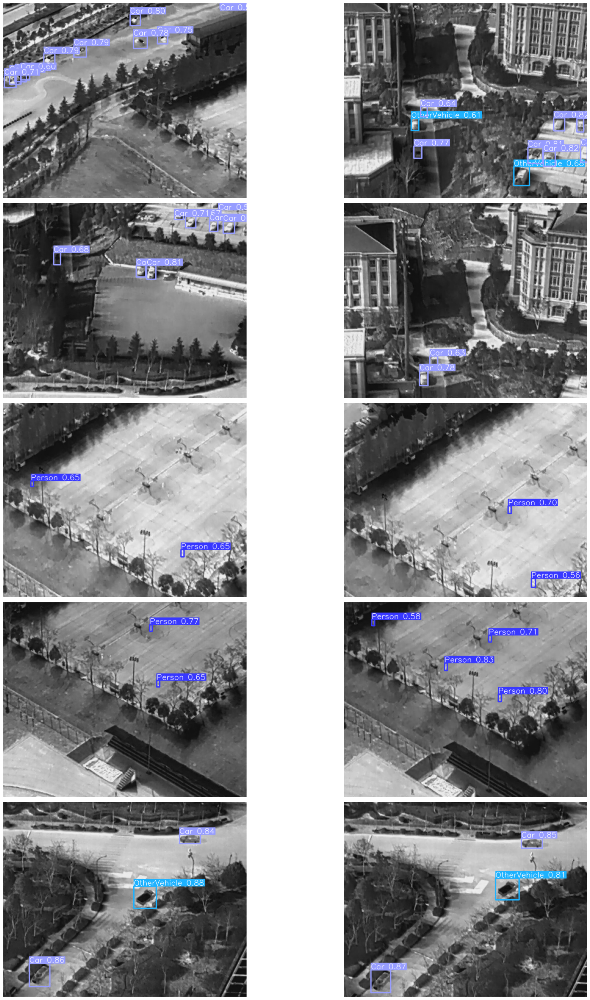

In [19]:
indices = list(range(len(results)))
random_indices = random.sample(indices, 10)
num_cols = 2
num_rows = 5

plt.figure(figsize=(12 * num_cols, 6 * num_rows))

for i, idx in enumerate(random_indices):
    image = results[i].plot()
    plt.subplot(num_rows, num_cols, i+1)
    plt.imshow(image)
    plt.axis('off')
plt.tight_layout()
plt.show()

## Compare predictions with ground truth

The ground truth labels will be shown in red box

In [20]:
ground_colors = [(255, 0, 0) for _ in range(len(classes))]

In [23]:
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding


In [24]:
!ls runs/detect

yolov8m_v8_50e	yolov8m_v8_50e2  yolov8m_v8_50e3  yolov8m_v8_50e4  yolov8m_v8_50e42


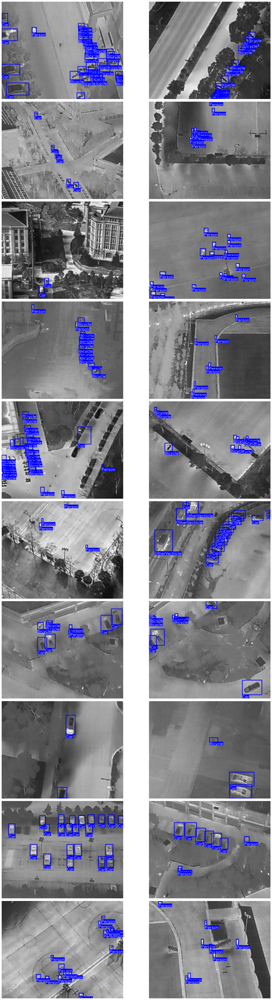

In [29]:
# Comparing a few testing images.
plot(
    # image_path='runs/detect/yolov8m_v8_50e',
    image_path = '/content/drive/MyDrive/hit-uav/images/test',
    label_path=os.path.join(ROOT_DIR, test_labels_dir),
    num_samples=20,
    classes=classes,
    colors=ground_colors,
    pos='below'
)

## Export model

In [30]:
success = model.export(format="onnx")  # export the model to ONNX format
success

Ultralytics YOLOv8.0.213 🚀 Python-3.10.12 torch-2.1.0+cu118 CPU (Intel Xeon 2.00GHz)

PyTorch: starting from 'runs/detect/yolov8m_v8_50e4/weights/best.pt' with input shape (1, 3, 512, 512) BCHW and output shape(s) (1, 9, 5376) (49.6 MB)
requirements: Ultralytics requirement ['onnx>=1.12.0'] not found, attempting AutoUpdate...
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.7/15.7 MB 124.8 MB/s eta 0:00:00

requirements: AutoUpdate success ✅ 9.0s, installed 1 package: ['onnx>=1.12.0']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect


ONNX: starting export with onnx 1.15.0 opset 17...
ONNX: export success ✅ 13.8s, saved as 'runs/detect/yolov8m_v8_50e4/weights/best.onnx' (98.7 MB)

Export complete (17.1s)
Results saved to /content/runs/detect/yolov8m_v8_50e4/weights
Predict:         yolo predict task=detect model=runs/detect/yolov8m_v8_50e4/weights/best.onnx imgsz=512  
Validate:        yolo val task=detect model=runs/detect/yolov8m_v8_50e4/weights/best.onnx 

'runs/detect/yolov8m_v8_50e4/weights/best.onnx'